In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
!pip install tflearn 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import tensorflow as tf
import tflearn
from tflearn.layers.conv import conv_2d, max_pool_2d
from tflearn.layers.core import input_data, dropout, fully_connected
from tflearn.layers.estimator import regression
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
import keras
from keras.models import Sequential, Model,load_model
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping,ModelCheckpoint
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
    #for filename in filenames:
        #print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip drive/My\ Drive/NN\ Project/NN\ Dataset.zip

In [52]:
train_datagen = ImageDataGenerator(zoom_range=0.15,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.15)

In [55]:
import random
img_size=224
training_data=[]

for dirname, _, filenames in os.walk('Train'):
    for filename in filenames:
    #print(os.path.join(filename))
    #data=cv2.imread()
      path=os.path.join(dirname, filename)
        
      label=filename.replace('_','.')
      label=label.split('.')
      label=label[0]
      img=cv2.imread(path,cv2.IMREAD_COLOR)
      img = img[:, :, [2, 1, 0]]
      img=cv2.resize(img,(img_size,img_size))
      # imgfliplr=cv2.flip(img,1)
      # imgrotate = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
      # imgflipud=cv2.flip(img,0)
      if(label=="Basketball"):
          label=[1,0,0,0,0,0]
          label=0
      elif(label=="Football"):
          label=[0,1,0,0,0,0]
          label=1
      elif(label=="Rowing"):
          label=[0,0,1,0,0,0]
          label=2
      elif(label=="Swimming"):
          label=[0,0,0,1,0,0] 
          label=3
      elif(label=="Tennis"):
          label=[0,0,0,0,1,0]
          label=4
      elif(label=="Yoga"):
          label=[0,0,0,0,0,1]
          label=5
            
      training_data.append([np.array(img),label])
      # training_data.append([np.array(imgfliplr),label])
      # training_data.append([np.array(imgrotate),label])
      # training_data.append([np.array(imgflipud),label])
      
        
random.shuffle(training_data)
print(len(training_data))

    

1681


In [56]:
x_train=np.array([i[0]for i in training_data]).reshape(-1,img_size,img_size,3)


print(x_train.shape)
#print(x_train)
y_train=np.array([i[1]for i in training_data])
#print(y_train)
print(y_train.shape)

    
      


    
    

(1681, 224, 224, 3)
(1681,)


In [57]:

def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [58]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [59]:
def ResNet50(input_shape=(224, 224, 3)):

    X_input = Input(input_shape)

    X = ZeroPadding2D((3, 3))(X_input)

    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    
    model = Model(inputs=X_input, outputs=X, name='ResNet50')

    return model


In [60]:
base_model = ResNet50(input_shape=(224, 224, 3))

In [61]:
headModel = base_model.output
headModel = Flatten()(headModel)
headModel=Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(headModel)
headModel=Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(headModel)
headModel = Dense( 6,activation='softmax', name='fc3',kernel_initializer=glorot_uniform(seed=0))(headModel)

In [62]:
model = Model(inputs=base_model.input, outputs=headModel)

In [63]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 64  9472        ['zero_padding2d_4[0][0]']       
                                )                                                           

In [64]:
base_model.load_weights("/content/drive/MyDrive/NN Project/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5")


In [65]:
for layer in base_model.layers:
    layer.trainable = False

In [66]:
for layer in model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x7feac60797c0> False
<keras.layers.reshaping.zero_padding2d.ZeroPadding2D object at 0x7feac6079970> False
<keras.layers.convolutional.conv2d.Conv2D object at 0x7feac6079be0> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7feac6079e20> False
<keras.layers.core.activation.Activation object at 0x7fea560e51c0> False
<keras.layers.pooling.max_pooling2d.MaxPooling2D object at 0x7feab0283490> False
<keras.layers.convolutional.conv2d.Conv2D object at 0x7fea5611fbe0> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7feab0057f40> False
<keras.layers.core.activation.Activation object at 0x7fea56135d30> False
<keras.layers.convolutional.conv2d.Conv2D object at 0x7feb2f18ddc0> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7feb2f133e80> False
<keras.layers.core.activation.Activation object at 0x7feb2f18db50> False
<keras.layers.convolutional

In [ ]:
# model = models.Sequential()
# model.add(layers.Conv2D(input_shape=(img_size,img_size,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
# model.add(layers.MaxPool2D(pool_size=(2,2),strides=(2,2)))
# model.add(layers.Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.MaxPool2D(pool_size=(2,2),strides=(2,2)))
# model.add(layers.Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.MaxPool2D(pool_size=(2,2),strides=(2,2)))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.MaxPool2D(pool_size=(2,2),strides=(2,2)))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
# model.add(layers.MaxPool2D(pool_size=(2,2),strides=(2,2)))

In [ ]:
# model.add(layers.Flatten())
# model.add(layers.Dense(units=4096,activation="relu"))
# model.add(layers.Dense(units=4096,activation="relu"))
# model.add(layers.Dense(units=6, activation="softmax"))
# model.summary()

In [67]:
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

In [68]:
#opt=tf.keras.optimizer.adam(learning_rate=0.001)
model.compile(optimizer=opt,loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics=['accuracy'])

/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


In [ ]:
# LR=0.001
# tf.compat.v1.reset_default_graph()
# conv_input=input_data(shape=[None,img_size,img_size,3],name="input")
# conv1 = conv_2d(conv_input, 32, 5, activation='relu')
# pool1 = max_pool_2d(conv1, 5)

# conv2 = conv_2d(pool1, 64, 5, activation='relu')
# pool2 = max_pool_2d(conv2, 5)

# conv3 = conv_2d(pool2, 128, 5, activation='relu')
# pool3 = max_pool_2d(conv3, 5)

# conv4 = conv_2d(pool3, 64, 5, activation='relu')
# pool4 = max_pool_2d(conv4, 5)

# conv5 = conv_2d(pool4, 32, 5, activation='relu')
# pool5 = max_pool_2d(conv5, 5)


# # conv3 = conv_2d(pool2, 256, 5, activation='relu')
# # pool3 = max_pool_2d(conv3, 5)

# # conv4 = conv_2d(pool3, 64, 5, activation='relu')
# # pool4 = max_pool_2d(conv4, 5)

# # conv5 = conv_2d(pool4, 32, 5, activation='relu')
# # pool5 = max_pool_2d(conv5, 5)

# fully_layer = fully_connected(pool5, 1000, activation='relu')
# fully_layer = dropout(fully_layer, 0.5)

# cnn_layers = fully_connected(fully_layer, 6, activation='softmax')

# cnn_layers = regression(cnn_layers, optimizer='adam', learning_rate=LR, loss='categorical_crossentropy', name='targets')
# model = tflearn.DNN(cnn_layers, tensorboard_dir='log', tensorboard_verbose=3)

In [70]:
model.fit(train_datagen.flow(x_train,y_train,batch_size=32),validation_data=train_datagen.flow(x_train,y_train,batch_size=8),epochs=20)

Epoch 1/20
47/47 [==============================] - ETA: 0s - batch: 23.0000 - size: 31.9149 - loss: 1.8318 - acc: 0.7473

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


47/47 [==============================] - 36s 709ms/step - batch: 23.0000 - size: 31.9149 - loss: 1.8319 - acc: 0.7473 - val_loss: 0.6202 - val_acc: 0.8653
Epoch 2/20
47/47 [==============================] - 33s 723ms/step - batch: 23.0000 - size: 31.9149 - loss: 0.6009 - acc: 0.8713 - val_loss: 2.0242 - val_acc: 0.7140
Epoch 3/20
47/47 [==============================] - 30s 659ms/step - batch: 23.0000 - size: 31.9149 - loss: 0.3019 - acc: 0.9200 - val_loss: 0.9649 - val_acc: 0.8280
Epoch 4/20
47/47 [==============================] - 31s 664ms/step - batch: 23.0000 - size: 31.9149 - loss: 0.2585 - acc: 0.9393 - val_loss: 0.6419 - val_acc: 0.8527
Epoch 5/20
47/47 [==============================] - 30s 650ms/step - batch: 23.0000 - size: 31.9149 - loss: 0.1255 - acc: 0.9613 - val_loss: 0.6401 - val_acc: 0.8613
Epoch 6/20
47/47 [==============================] - 32s 689ms/step - batch: 23.0000 - size: 31.9149 - loss: 0.1023 - acc: 0.9707 - val_loss: 0.6690 - val_acc: 0.8500
Epoch 7/20
47/4

In [ ]:
class EarlyStoppingCallback(tflearn.callbacks.Callback):
    def __init__(self, val_acc_thresh):
        """ Note: We are free to define our init function however we please. """
        # Store a validation accuracy threshold, which we can compare against
        # the current validation accuracy at, say, each epoch, each batch step, etc.
        self.val_acc_thresh = val_acc_thresh
    
    def on_epoch_end(self, training_state):
        """ 
        This is the final method called in trainer.py in the epoch loop. 
        We can stop training and leave without losing any information with a simple exception.  
        """
        if(training_state.acc_value>=self.val_acc_thresh):
          print("Terminating training at the end of epoch", training_state.epoch)
          raise StopIteration
    
    def on_train_end(self, training_state):
        """
        Furthermore, tflearn will then immediately call this method after we terminate training, 
        (or when training ends regardless). This would be a good time to store any additional 
        information that tflearn doesn't store already.
        """
        print("Successfully left training! Final model accuracy:", training_state.acc_value)
       
        



  
# Initialize our callback with desired accuracy threshold.  
early_stopping_cb = EarlyStoppingCallback(val_acc_thresh=0.95)

In [ ]:
MODEL_NAME="Sports_Classification"
try:
  model.fit({'input': x_train}, {'targets': y_train}, n_epoch=25,
          validation_set=(0.2),
          snapshot_step=500, show_metric=True, run_id=MODEL_NAME,callbacks=early_stopping_cb)
except StopIteration:
  print("Early Stopping Condition Reached")  


Training Step: 2047  | total loss: 0.17315 | time: 8.091s
| Adam | epoch: 026 | loss: 0.17315 - acc: 0.9638 -- iter: 0064/5379


KeyboardInterrupt: ignored

In [72]:
model.save('keras_resnet50_color_datagen.h5')

In [73]:
newmodel=load_model('keras_resnet50_color_datagen.h5')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Basketball: 6.182252982477213e-21, Football: 3.1732751842872275e-11,Rowing: 7.352757674963341e-22,Swimming: 3.3332639129735364e-24,Tennis: 3.395904000710881e-12,Yoga: 1.0


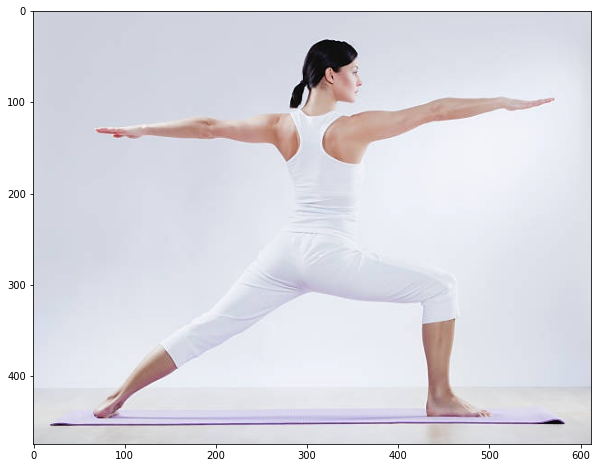

Basketball: 1.1854901799986812e-19, Football: 1.995443463825585e-19,Rowing: 1.0,Swimming: 1.2822823315314369e-12,Tennis: 4.933114029113478e-22,Yoga: 4.250542851039475e-18


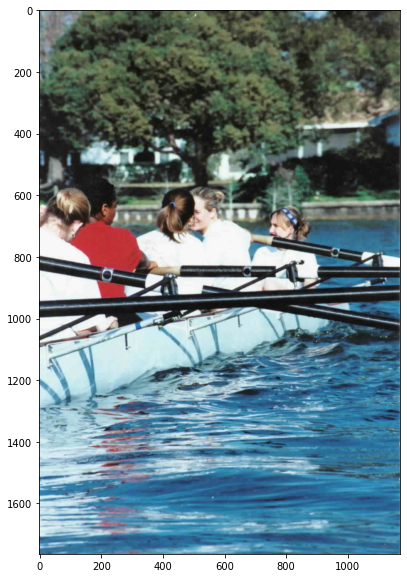

Basketball: 1.0588103126195407e-19, Football: 1.5656114422333547e-15,Rowing: 4.546457357699641e-20,Swimming: 2.668659301065241e-20,Tennis: 6.624230650771265e-14,Yoga: 1.0


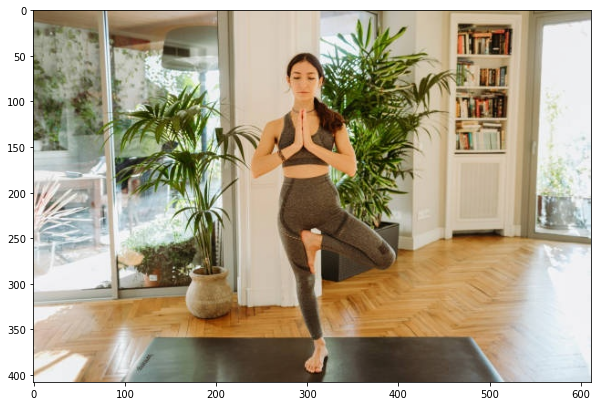

Basketball: 5.064552835269687e-13, Football: 1.3079212712874266e-10,Rowing: 2.1899190360413767e-12,Swimming: 7.957515397484516e-13,Tennis: 1.0,Yoga: 5.953557417025246e-15


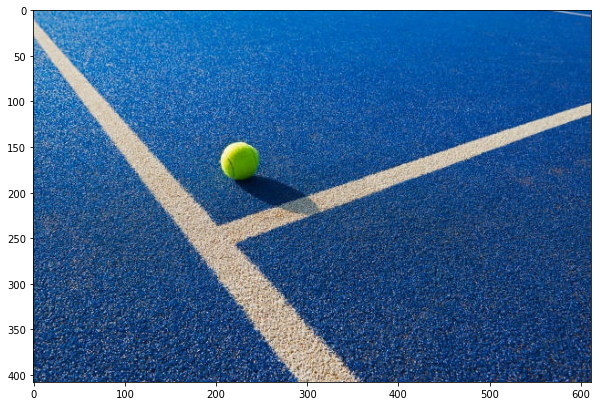

Basketball: 1.2428170471923128e-11, Football: 1.0,Rowing: 6.804187768771897e-10,Swimming: 8.9869225462828e-22,Tennis: 2.0067263822864945e-11,Yoga: 1.0280812766462317e-16


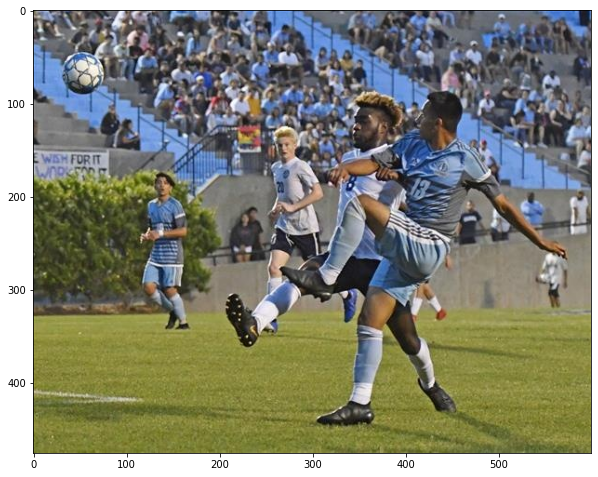

Basketball: 1.7495104757264679e-12, Football: 0.9999929666519165,Rowing: 1.2322949952126017e-11,Swimming: 1.300060866380127e-20,Tennis: 7.030592769297073e-06,Yoga: 5.852362323054139e-13


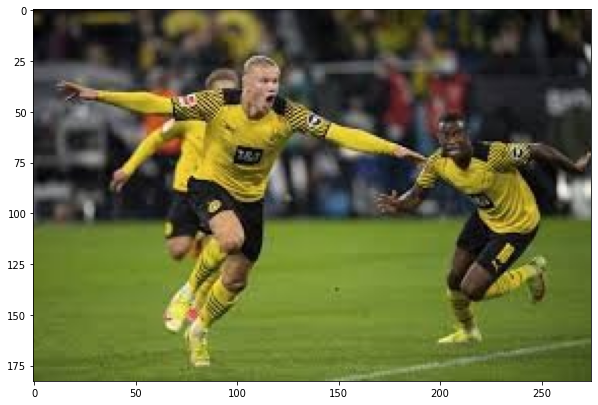

Basketball: 1.9638414414657746e-06, Football: 0.0001229754270752892,Rowing: 0.00014432246098294854,Swimming: 4.122863414058632e-14,Tennis: 0.9997307658195496,Yoga: 2.1194259680612504e-09


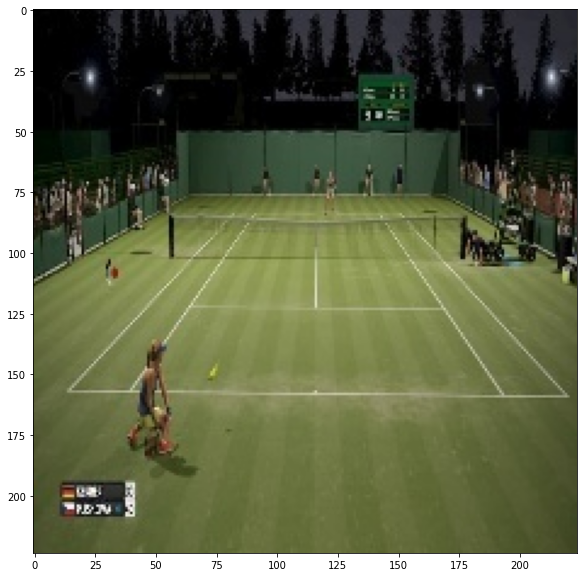

Basketball: 3.439927059648414e-16, Football: 1.0,Rowing: 1.745025235422304e-10,Swimming: 2.619876990869619e-22,Tennis: 1.4277865185725186e-14,Yoga: 2.0774199059629457e-19


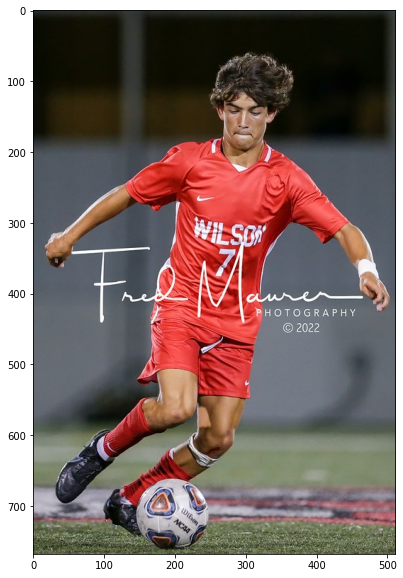

Basketball: 2.556576424999534e-19, Football: 5.467703140054609e-18,Rowing: 1.0,Swimming: 1.2924335758649494e-15,Tennis: 1.935714865239596e-15,Yoga: 2.664044657617326e-14


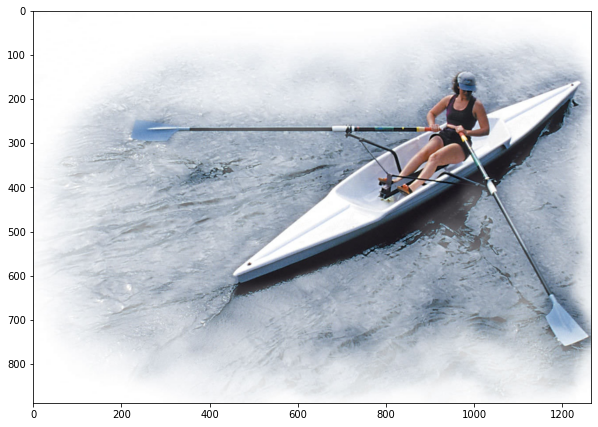

Basketball: 3.602921960776939e-09, Football: 4.306085799044013e-08,Rowing: 5.058736415874954e-11,Swimming: 1.0794099016066785e-18,Tennis: 1.0,Yoga: 2.7419073955758932e-11


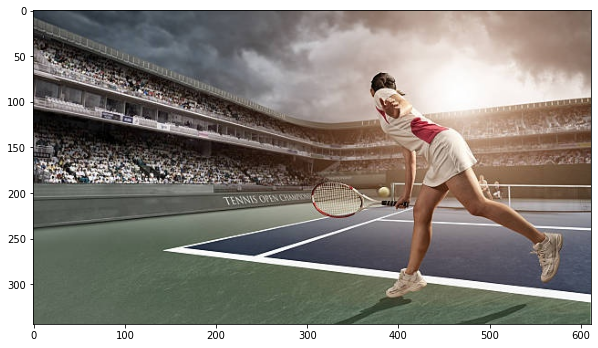

Basketball: 2.0473664985587448e-09, Football: 0.00016543746460229158,Rowing: 0.9998345375061035,Swimming: 2.3453694542041603e-10,Tennis: 1.822882955693217e-10,Yoga: 2.4029089829014083e-09


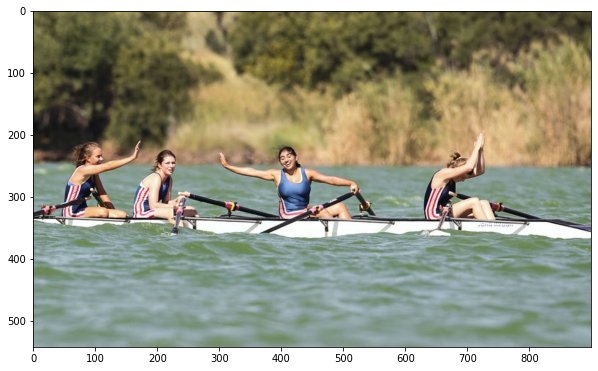

Basketball: 2.9036043014407653e-10, Football: 9.43068343417508e-08,Rowing: 1.873002863916895e-10,Swimming: 1.2364159175659584e-12,Tennis: 9.081200680327584e-09,Yoga: 0.9999998807907104


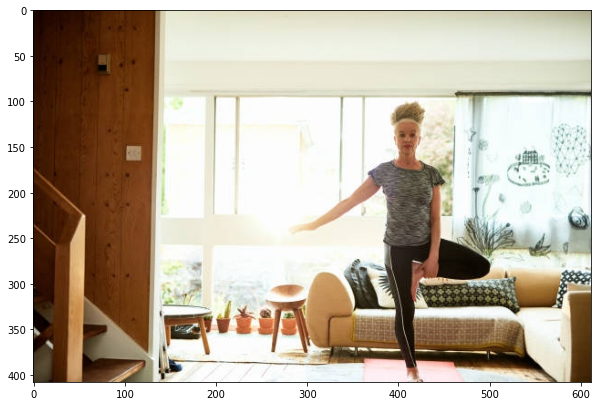

Basketball: 7.207650708912494e-12, Football: 1.1987830866866389e-11,Rowing: 1.0,Swimming: 6.640493276782733e-12,Tennis: 3.607047771581051e-09,Yoga: 3.324619052280653e-11


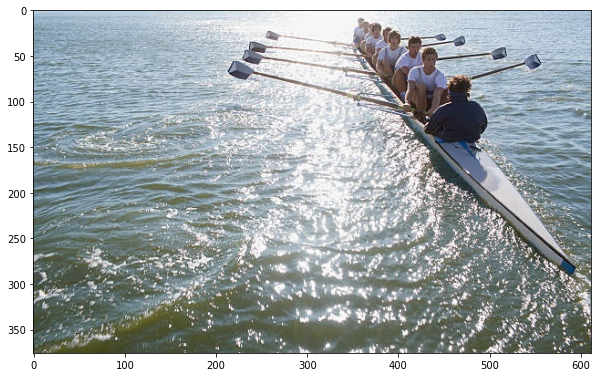

Basketball: 2.4424224420727114e-07, Football: 0.7066879272460938,Rowing: 0.2913976013660431,Swimming: 0.0014520254917442799,Tennis: 9.863306331681088e-05,Yoga: 0.0003635768371168524


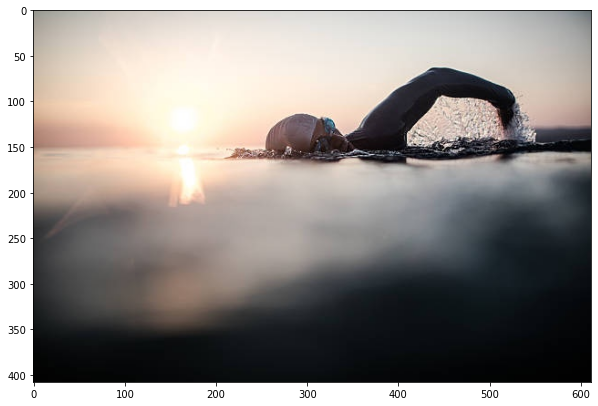

Basketball: 0.33396193385124207, Football: 0.38693127036094666,Rowing: 1.5801876998011721e-06,Swimming: 3.875133458564051e-08,Tennis: 0.03382252901792526,Yoga: 0.24528266489505768


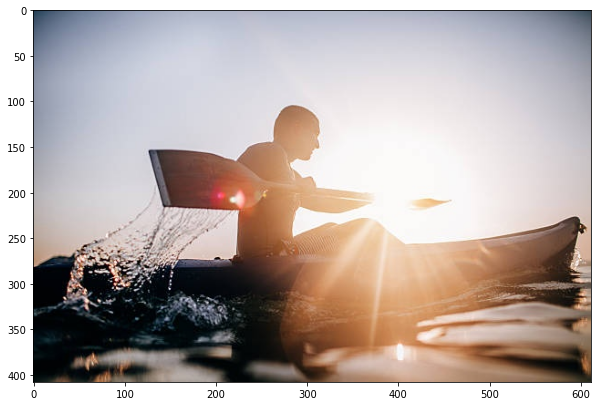

Basketball: 6.021370624331723e-10, Football: 2.9025060939602554e-05,Rowing: 1.4744504506225553e-09,Swimming: 2.1503882929960888e-13,Tennis: 0.9999709129333496,Yoga: 2.4134678255904873e-08


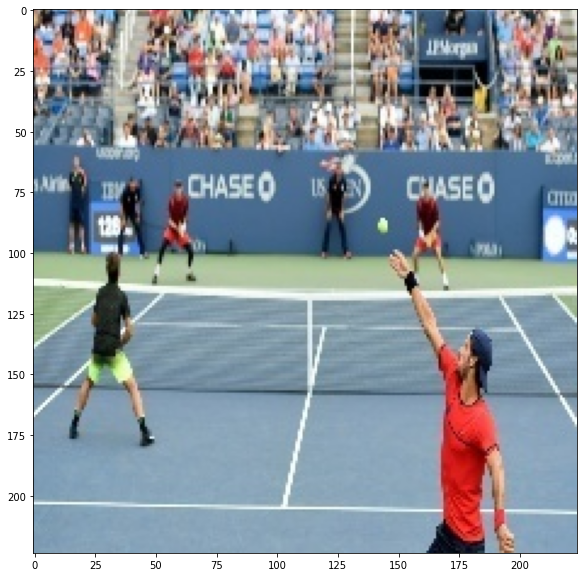

Basketball: 3.3092437661252916e-06, Football: 0.9999854564666748,Rowing: 8.501877346134279e-06,Swimming: 1.6059416031158e-14,Tennis: 2.7133078219776507e-06,Yoga: 2.1549065309933724e-10


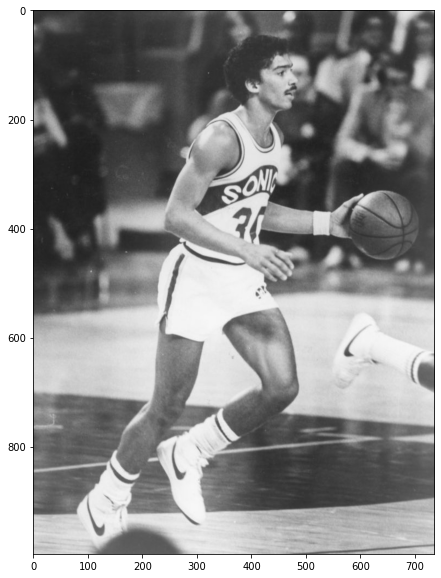

Basketball: 2.4424224420727114e-07, Football: 0.7066879272460938,Rowing: 0.2913976013660431,Swimming: 0.0014520254917442799,Tennis: 9.863306331681088e-05,Yoga: 0.0003635768371168524


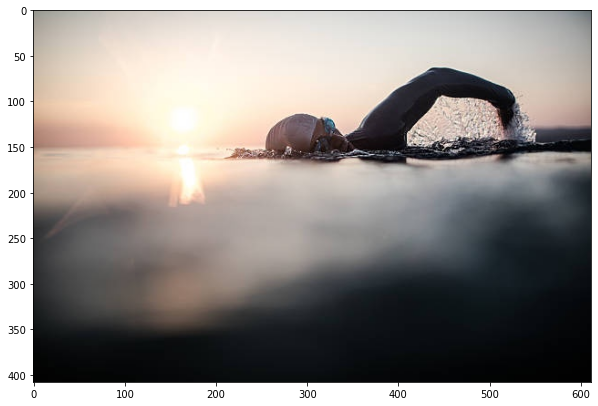

Basketball: 0.012069162912666798, Football: 0.27910730242729187,Rowing: 0.7072389721870422,Swimming: 3.510587820443334e-09,Tennis: 0.0007686869939789176,Yoga: 0.0008159120916388929


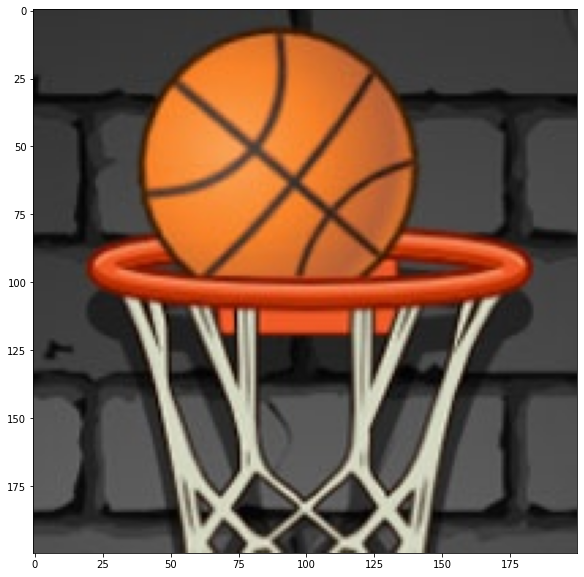

Basketball: 0.01332546304911375, Football: 2.3847370300700277e-08,Rowing: 0.9866732358932495,Swimming: 2.9759434028164833e-07,Tennis: 5.424352877980709e-08,Yoga: 9.344564091406937e-07


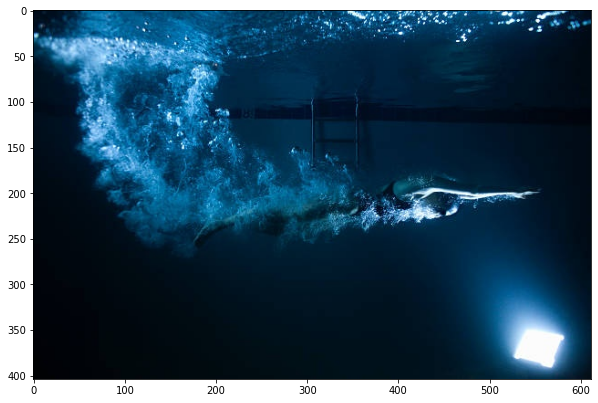

Basketball: 1.2155431012867562e-14, Football: 1.0,Rowing: 1.3257289417731993e-13,Swimming: 1.3649659666678457e-17,Tennis: 8.974156487373541e-12,Yoga: 4.5329611917353796e-15


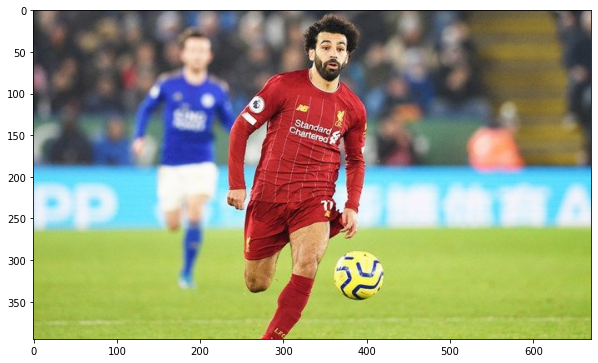

Basketball: 2.020060415599753e-14, Football: 1.0,Rowing: 9.215414889518492e-13,Swimming: 1.0620039147676966e-23,Tennis: 2.8141680652460366e-10,Yoga: 2.744450855601406e-18


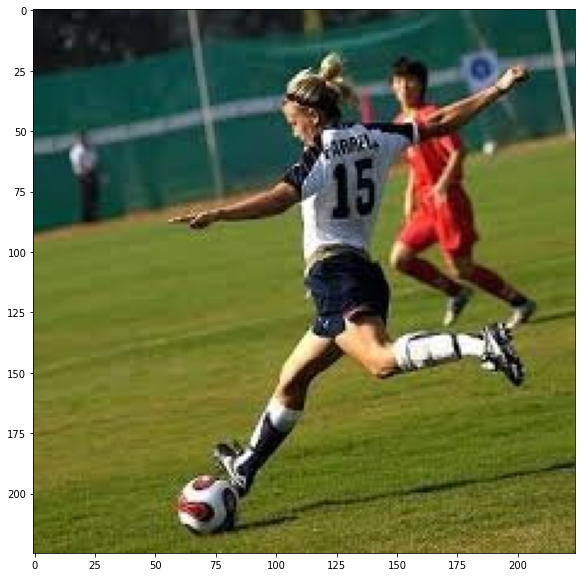

Basketball: 5.55410643691967e-13, Football: 1.6454203277671553e-10,Rowing: 8.994754097102486e-08,Swimming: 0.9999998807907104,Tennis: 1.315236586307833e-09,Yoga: 2.7174096306481488e-12


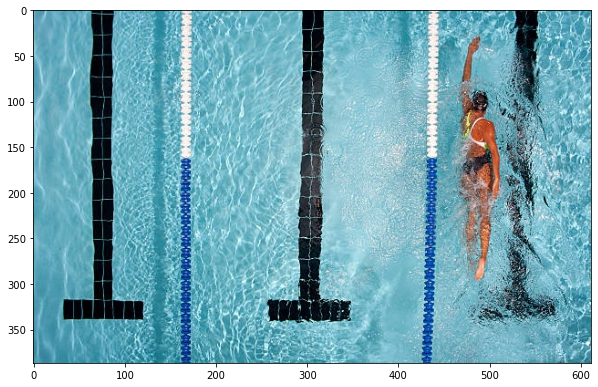

Basketball: 6.58548979237672e-11, Football: 1.0,Rowing: 5.755084231395813e-08,Swimming: 1.2573510593764524e-16,Tennis: 5.485737641919286e-09,Yoga: 2.1552592067812515e-13


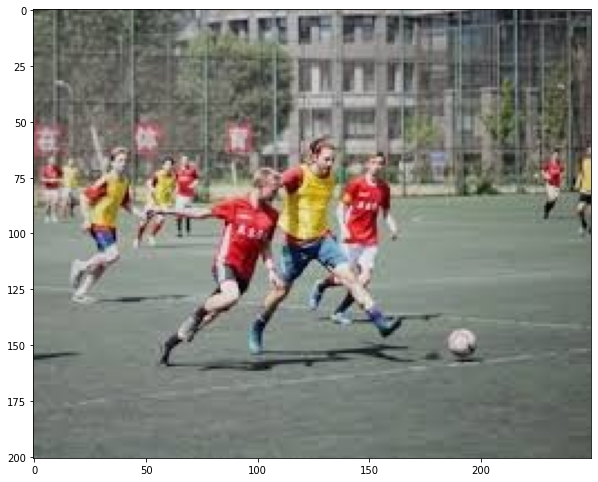

Basketball: 9.612179860385688e-15, Football: 2.4403928923781744e-14,Rowing: 1.0,Swimming: 2.9700342086701106e-15,Tennis: 1.184036089539632e-17,Yoga: 2.2534917691380187e-15


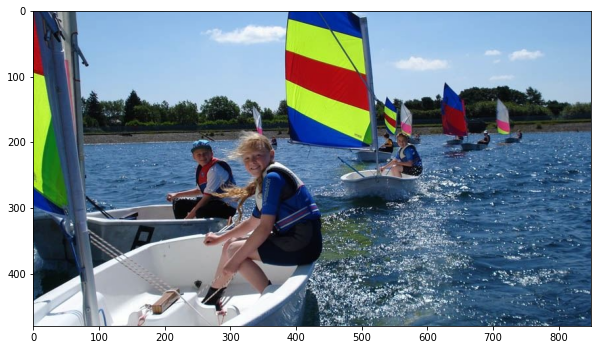

Basketball: 2.1757540498543344e-15, Football: 4.376917732873582e-14,Rowing: 2.94302444672212e-05,Swimming: 0.999970555305481,Tennis: 3.371075507629939e-08,Yoga: 9.324765352231035e-13


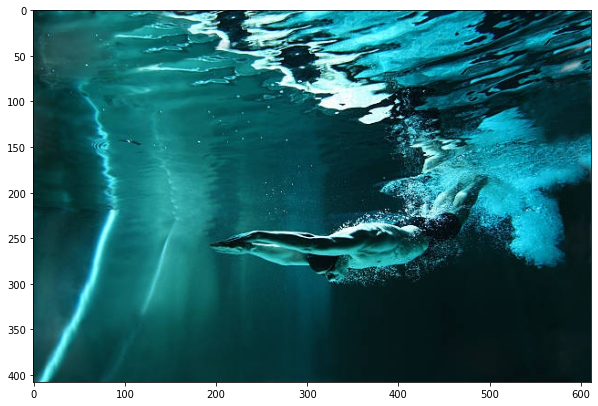

Basketball: 3.0974248943493876e-08, Football: 0.008162317797541618,Rowing: 0.00025677503435872495,Swimming: 0.9911189675331116,Tennis: 9.064364712685347e-05,Yoga: 0.0003713615005835891


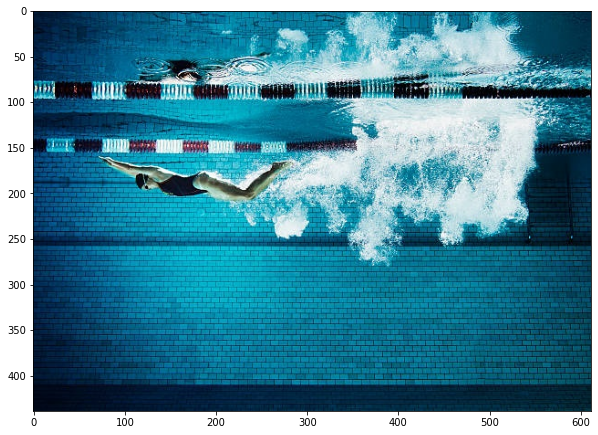

Basketball: 1.0, Football: 7.257104205765641e-12,Rowing: 8.042735856646221e-13,Swimming: 2.9382876785048154e-16,Tennis: 1.340348831924132e-09,Yoga: 1.3127320851711883e-14


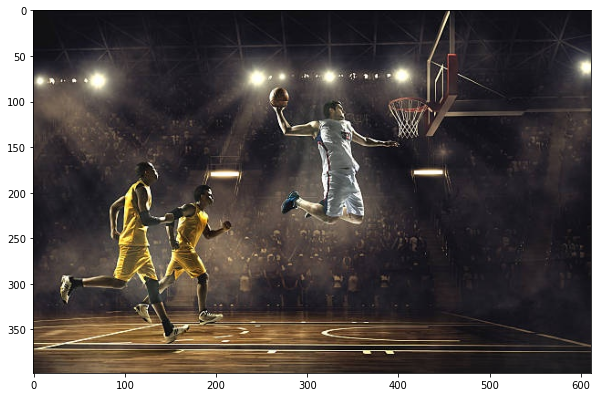

Basketball: 7.000151981628733e-06, Football: 0.9999929666519165,Rowing: 1.2274034870071726e-12,Swimming: 2.2756452740846972e-20,Tennis: 1.854464493078467e-08,Yoga: 2.0342741380297014e-11


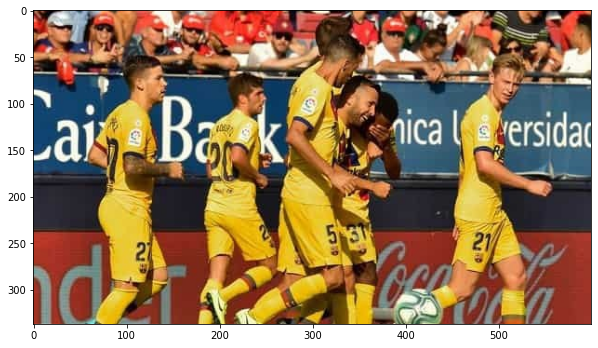

Basketball: 2.3531390724862433e-10, Football: 8.383110383647363e-08,Rowing: 4.27719896833878e-05,Swimming: 0.9999566078186035,Tennis: 3.4968823570125096e-07,Yoga: 1.0621304369351492e-07


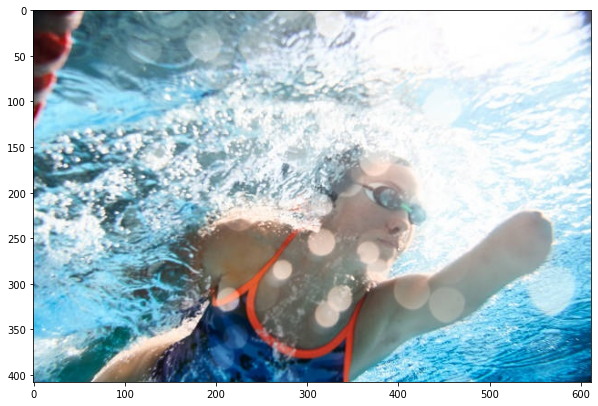

Basketball: 4.450337200978538e-07, Football: 0.2999918460845947,Rowing: 4.726701252621979e-10,Swimming: 3.5875724727118044e-15,Tennis: 0.7000074982643127,Yoga: 1.3720864444621839e-07


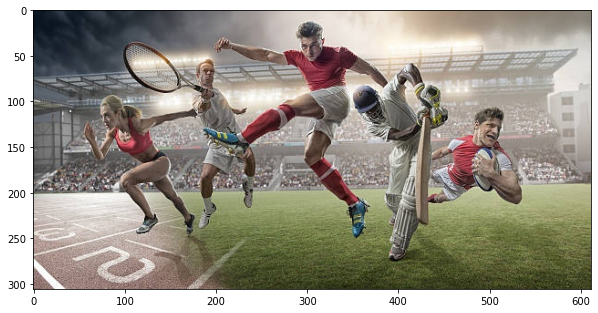

Basketball: 2.79125864072923e-16, Football: 1.0,Rowing: 1.0177627837726355e-11,Swimming: 8.002037249137215e-16,Tennis: 3.400596861394267e-12,Yoga: 1.2847390015171493e-14


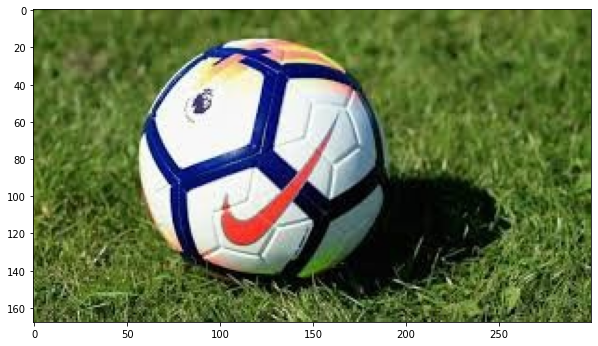

Basketball: 7.304630984566937e-18, Football: 1.2294394480250048e-07,Rowing: 1.398732306452873e-17,Swimming: 5.4256202132998745e-21,Tennis: 9.664859135227744e-09,Yoga: 0.9999998807907104


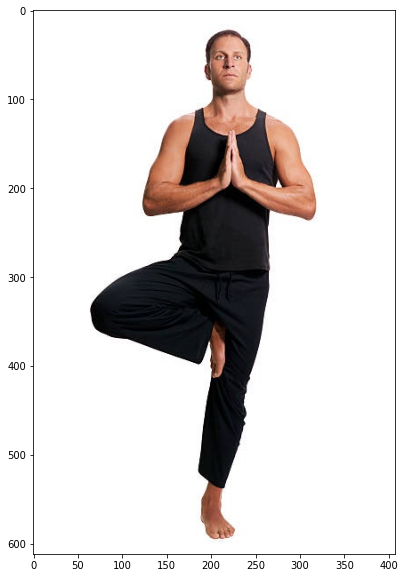

Basketball: 0.5642437934875488, Football: 0.4357191026210785,Rowing: 3.524369822116569e-05,Swimming: 1.4606467146904833e-09,Tennis: 1.8626517430675449e-06,Yoga: 3.473609247461873e-11


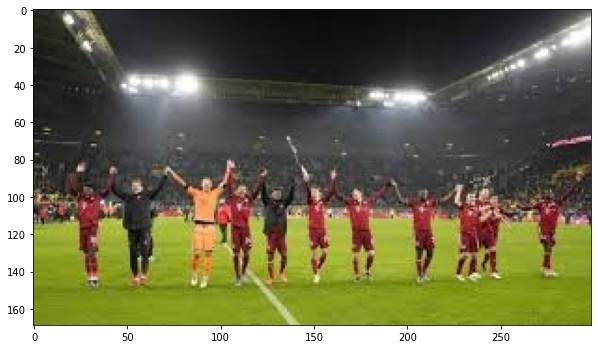

Basketball: 2.7836911648719922e-21, Football: 2.2156128320904855e-10,Rowing: 1.3958420805239455e-19,Swimming: 7.467261403336023e-23,Tennis: 7.519843255032743e-12,Yoga: 1.0


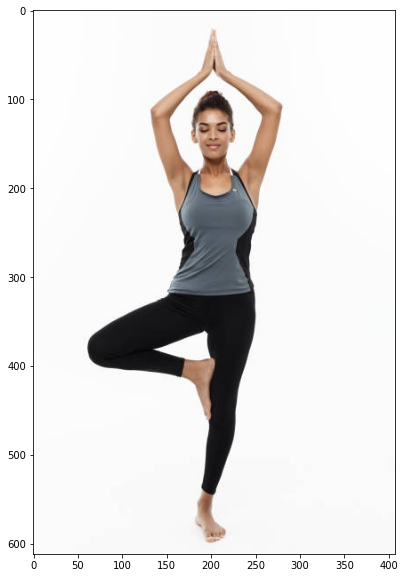

Basketball: 6.859558934011033e-23, Football: 8.261378752649762e-06,Rowing: 9.109540900954991e-17,Swimming: 2.1978946718428373e-26,Tennis: 3.737995359748801e-15,Yoga: 0.999991774559021


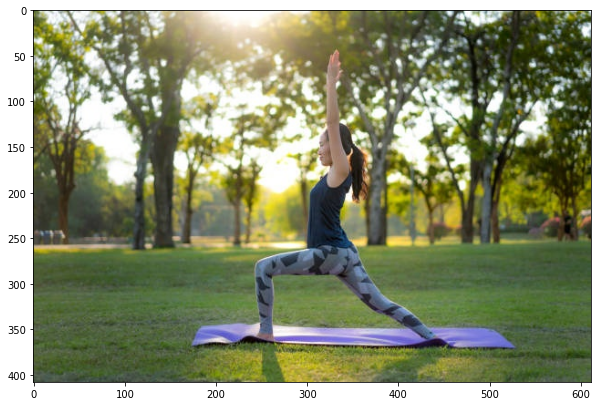

Basketball: 2.8350161329626644e-08, Football: 4.466177774831159e-11,Rowing: 0.999220609664917,Swimming: 0.0007738248677924275,Tennis: 5.652559138979996e-06,Yoga: 2.3881230651855156e-13


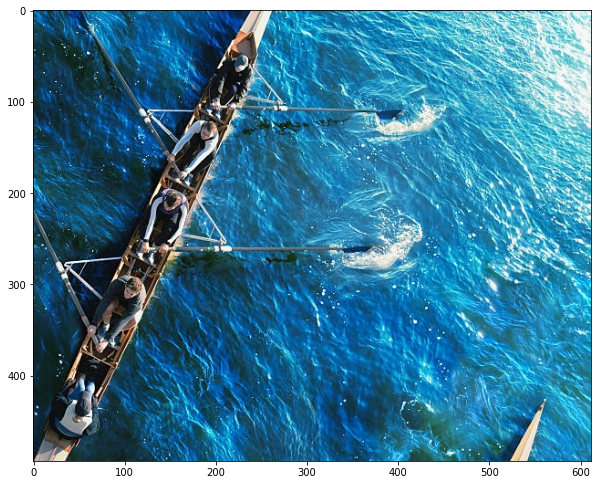

Basketball: 2.8383123691524785e-14, Football: 1.0,Rowing: 5.736286012164582e-13,Swimming: 3.980564675385724e-23,Tennis: 8.108053481002339e-14,Yoga: 8.66057770470775e-18


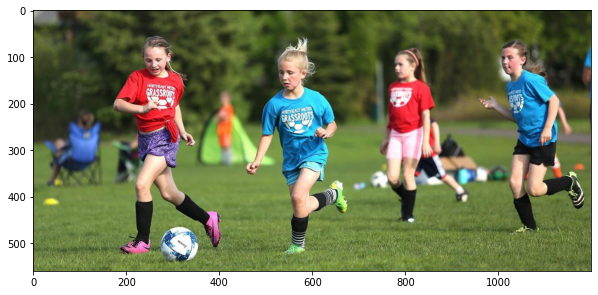

Basketball: 1.116655205801731e-11, Football: 0.999402642250061,Rowing: 1.5880515791266703e-09,Swimming: 1.4455813348060387e-17,Tennis: 0.0005904395366087556,Yoga: 6.880386536067817e-06


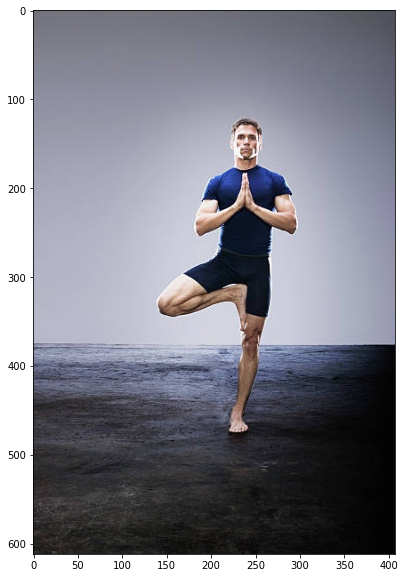

Basketball: 3.202749454533915e-10, Football: 1.8577264171426577e-09,Rowing: 0.9999998807907104,Swimming: 1.3456690206581357e-09,Tennis: 1.0943613792946394e-09,Yoga: 7.603625107321932e-08


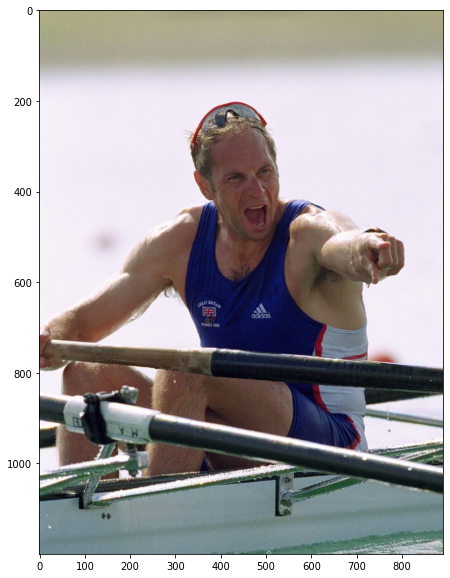

Basketball: 2.4212395438233548e-18, Football: 1.3659831407409348e-15,Rowing: 2.1927476652992828e-13,Swimming: 1.0,Tennis: 1.3440755453064668e-10,Yoga: 6.497627007837417e-15


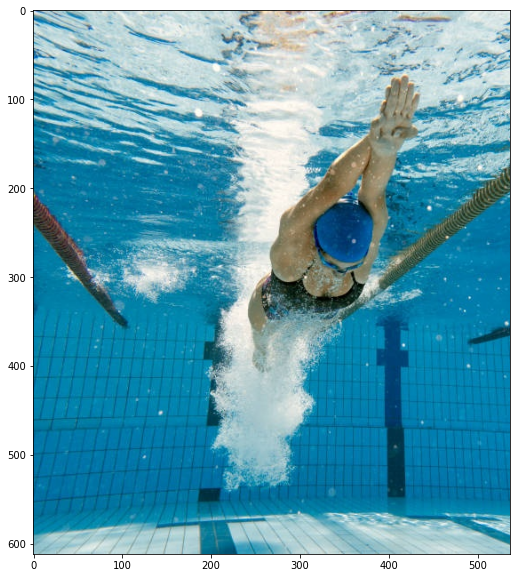

In [74]:
from google.colab import files
import matplotlib.pyplot as plt
output=pd.DataFrame(columns=['image_name','label'])
i=0
for dirname, _, filenames in os.walk('Test'):
    for filename in filenames:

        
    #print(os.path.join(filename))
    #data=cv2.imread()
      path=os.path.join(dirname, filename)
        
#         label=filename.replace('_','.')
#         label=label.split('.')
#         label=label[0]
      img=cv2.imread(path,cv2.IMREAD_COLOR)
      img = img[:, :, [2, 1, 0]]
      test_img=cv2.resize(img,(img_size,img_size))
#          if(label=="Basketball"):
#             label=[1,0,0,0,0,0]
#         elif(label=="Football"):
#             label=[0,1,0,0,0,0]
#         elif(label=="Rowing"):
#             label=[0,0,1,0,0,0]
#         elif(label=="Swimming"):
#             label=[0,0,0,1,0,0] 
#         elif(label=="Tennis"):
#             label=[0,0,0,0,1,0]
#         elif(label=="Yoga"):
#             label=[0,0,0,0,0,1]
      test_img=test_img.reshape(1,img_size,img_size,3)
      prediction=newmodel.predict([test_img])[0]
      max_index = np.argmax(prediction)
      new_row={'image_name':filename,'label':max_index}
      output=output.append(new_row,ignore_index=True)
      fig = plt.figure(figsize=(10, 10))
      ax = fig.add_subplot(111)
      ax.imshow(img)
      print(f"Basketball: {prediction[0]}, Football: {prediction[1]},Rowing: {prediction[2]},Swimming: {prediction[3]},Tennis: {prediction[4]},Yoga: {prediction[5]}")
        
      plt.show()
      if(i==40):
          break
      i+=1
# print(output)
# output.to_csv('file1.csv',index=False)
# files.download('file1.csv')